# Modélisation

## Lagrangienne

On part du Lagrangien classique
$$L=\frac{m}{2}(\dot{x}^2+\dot{y}^2+\dot{z}^2)-mgz-\frac{k}{2}(\sqrt{x^2+y^2+z^2}-l)^2,$$

Puis on introduit les coordonnée sphériques
$$
\begin{cases}
x = r\sin(\theta)\cos(\phi)\\
y = r\sin(\theta)\sin(\phi)\\
z = r\cos(\theta)
\end{cases}
$$
où $r$, $\theta$ et $\phi$ dépendent du temps.

On arrive alors au Lagrangien
$$
L=\frac{m}{2}(\dot{r}^2+r^2\dot{\theta}^2+r^2\sin^2(\theta)\dot{\phi}^2)-mgr\cos(\theta)-\frac{k}{2}(r-l)^2.
$$

Les équations d'Euler-Lagrange sont maintenant
$$
\begin{cases}
\ddot{r} = r\dot{\theta}^2+r\sin^2(\theta)\dot{\phi}^2-g\cos(\theta)-\frac{k}{m}(r-l)\\
\ddot{\theta} = -\frac{2m\dot{r}\dot{\theta}}{r}+\sin(\theta)(\cos(\theta)\dot{\phi}^2+\frac{g}{r})\\
r^2\sin^2(\theta)\left(\ddot{\phi}+\frac{2\dot{\theta}\dot{\phi}}{\tan(\theta)}+\frac{2\dot{r}\dot{\phi}}{r}\right) = 0
\end{cases}
$$

## Hamiltonienne

On introduit les coordonnées
$$
\begin{cases}
p = m\dot{r}\\
\alpha = mr^2\dot{\theta}\\
\beta = mr^2\sin^2(\theta)\dot{\phi}
\end{cases}
$$

Le Hamiltonien est alors
$$
H:=\dot{r}p+\dot{\theta}\alpha+\dot{\phi}\beta-L=\frac{p^2}{2m}+\frac{\alpha^2}{2mr^2}+\frac{\beta^2}{2mr^2\sin^2(\theta)}+mgr\cos(\theta)+\frac{k}{2}(r-l)^2.
$$

### On notera que le Hamiltonien a potentiellement des singularités

En $r=0$ ou $\sin(\theta)=0$ mais $H$ est conservé or ces singularités le ferait obligatoirement valoir $+\infty$. Du point de vue numérique il faudra faire attention à conserver au maximum $H$.

On obtient finalement les équations différentielles
$$
\begin{cases}
\dot{r} = \frac{\partial H}{\partial p} = \frac{p}{m}\\
\dot{\theta} = \frac{\partial H}{\partial \alpha } = \frac{\alpha}{mr^2}\\
\dot{\phi} = \frac{\partial H}{\partial \beta } = \frac{\beta}{mr^2\sin^2(\theta)}\\
\dot{p} = -\frac{\partial H}{\partial r } = \frac{\alpha^2}{mr^3}+\frac{\beta^2}{mr^3\sin^2(\theta)}-mg\cos(\theta)-k(r-l)\\
\dot{\alpha} = -\frac{\partial H}{\partial \theta} = mgr\sin(\theta)+\frac{\beta^2 \cos(\theta)}{mr^2\sin^3(\theta)}\\
\dot{\beta} = -\frac{\partial H}{\partial \phi } = 0
\end{cases}
$$

# Simulation

## Calcul

In [1]:
import numpy as np
from scipy.integrate import odeint

In [2]:
m, g, l, k = 1, 10, 1, 30

In [3]:
def flux(X, t):
    r, theta, phi, p, alpha, beta = X
    dr = p/m
    dtheta = alpha/(m*r**2)
    dphi = beta/(m*r**2*(np.sin(theta))**2)
    dp = alpha**2/(m*r**3)+beta**2/(m*r**3*(np.sin(theta))**2)-m*g*np.cos(theta)-k*(r-l)
    dalpha = m*g*r*np.sin(theta)+beta**2*np.cos(theta)/(m*r**2*(np.sin(theta))**3)
    dbeta = 0
    return np.array([dr, dtheta, dphi, dp, dalpha, dbeta])

In [4]:
ini = np.array([1.2, 0.5, 0.7, 0.1, 0.2, 0.3])
temps = np.arange(0, 50, 0.05)

In [5]:
solution = odeint(func=flux, t=temps, y0=ini)

## Affichage

In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [7]:
%matplotlib inline
plt.rc("figure", figsize=(12,9))
plt.rcParams["animation.writer"] = "avconv"

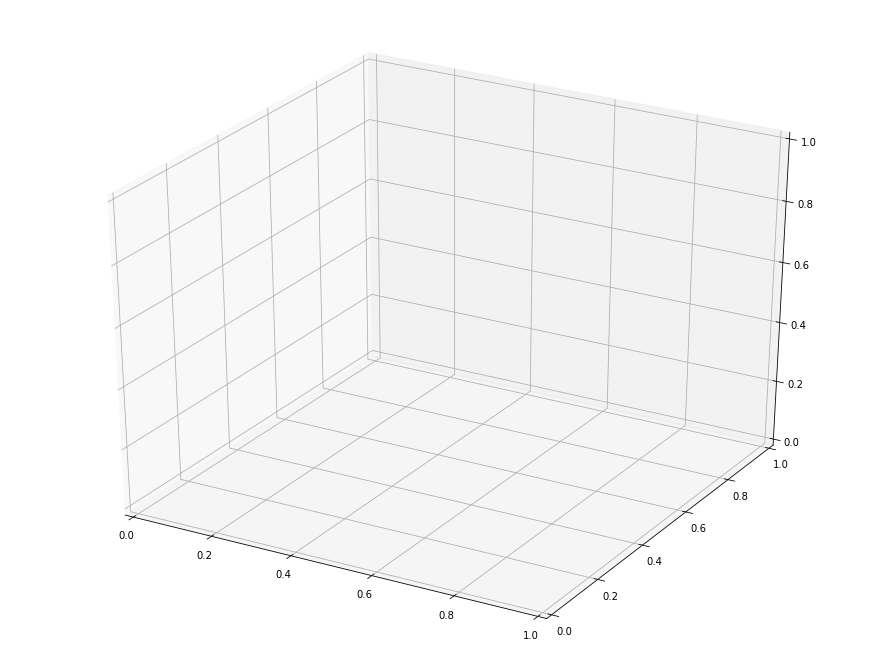

In [8]:
fig = plt.figure()
ax = Axes3D(fig)

In [9]:
r, theta, phi = solution[:, 0], solution[:, 1], solution[:, 2]
x = r*np.sin(theta)*np.cos(phi)
y = r*np.sin(theta)*np.sin(phi)
z = r*np.cos(theta)

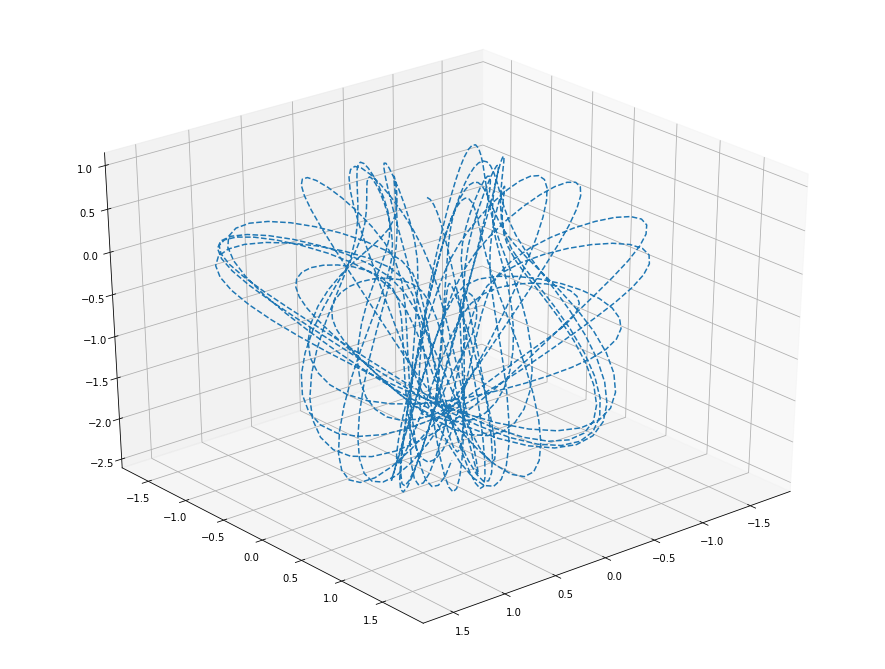

In [10]:
ax.plot(x, y, z, ls="--")
ax.view_init(30, 50)
fig

## Animation

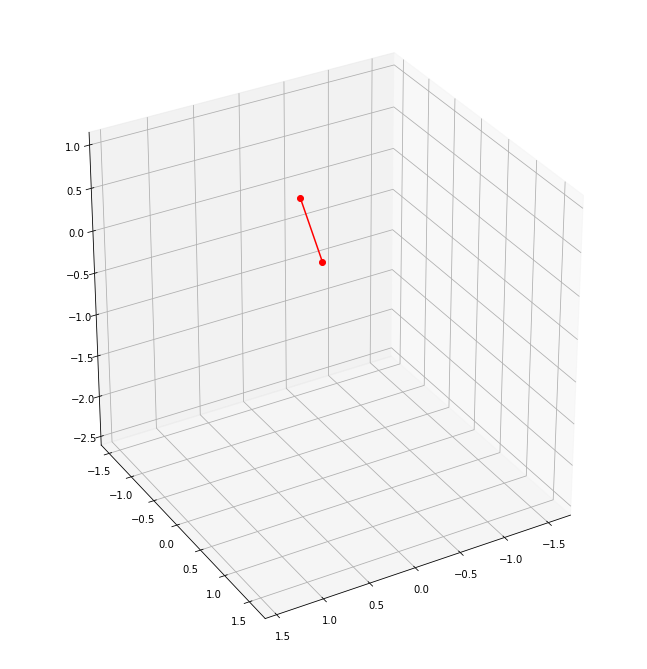

In [11]:
fig = plt.figure()
ax = Axes3D(fig)

traj, = ax.plot([], [], [], ls="--", color="blue")
tige, = ax.plot([], [], [], marker="o", color="red")

ax.set_xlim([np.min(x), np.max(x)])
ax.set_ylim([np.min(y), np.max(y)])
ax.set_zlim([np.min(z), np.max(z)])
ax.axes.set_aspect("equal")
ax.view_init(30, 60)

def maj(k):
    ax.view_init(30, 60-0.1*k)
    tige.set_data([0, x[k]], [0, y[k]])
    tige.set_3d_properties([0, z[k]])
    traj.set_data(x[:k], y[:k])
    traj.set_3d_properties(z[:k])
    return tige, traj

ani = FuncAnimation(fig=fig, func=maj, frames=range(len(x)), interval=50, blit=True)

In [14]:
ani.save("test.mp4")

In [13]:
HTML(ani.to_html5_video())